# Dementia diagnosis using MMSE results and AI
- MMSE stands for **Mini-Mental State Examination**
- 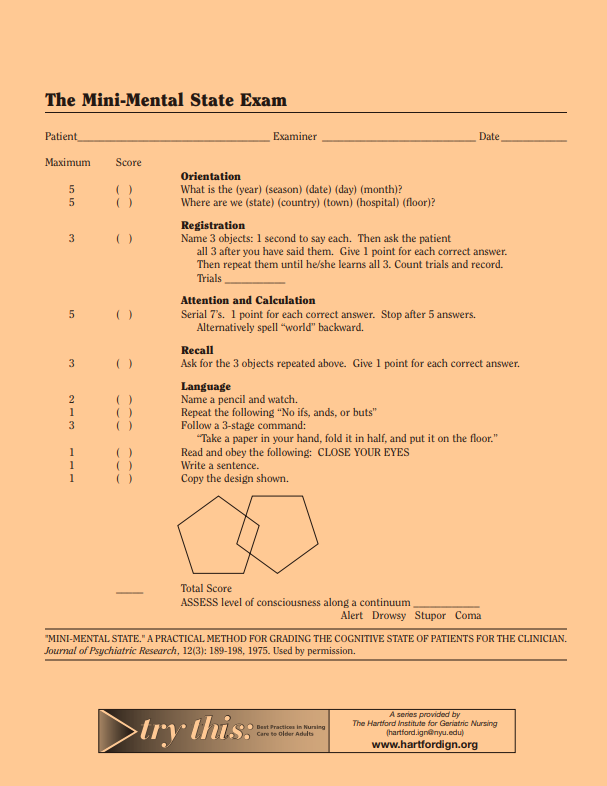
- Instead of simply adding each scores, let's use AI to evaluate the results!
- We will take scores for each task and feed it into AI model 
## Preprocessing
- We need to preprocess diagnosis.csv and MMSE.csv
### Drop Unnecessary columns and NAs
#### MMSE.csv
- column names starting with MM refers to each tasks(Exclude MMLTR~s because they are duplicates)
- PTID and VISDATE is needed for merging with diagnosis data

In [2]:
import pandas as pd
mmse = pd.read_csv('mmse.csv')

# choose column names starting with MM but not MMLTR
mmse2 = mmse.filter(regex='^MM(?!LTR)', axis=1)

#tasks are mmse columns except MMSCORE
tasks = mmse2.columns[:-1].to_list()
print(tasks)

mmse2['VISDATE'] = mmse['VISDATE'].copy()
mmse2['PTID'] = mmse['PTID'].copy()

mmse2=mmse2.dropna(axis=0, how='any')

['MMDATE', 'MMYEAR', 'MMMONTH', 'MMDAY', 'MMSEASON', 'MMHOSPIT', 'MMFLOOR', 'MMCITY', 'MMAREA', 'MMSTATE', 'MMTRIALS', 'MMD', 'MML', 'MMR', 'MMO', 'MMW', 'MMWATCH', 'MMPENCIL', 'MMREPEAT', 'MMHAND', 'MMFOLD', 'MMONFLR', 'MMREAD', 'MMWRITE', 'MMDRAW']


C:\Users\yeon0\AppData\Local\Temp\ipykernel_49500\1058792433.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mmse2['VISDATE'] = mmse['VISDATE'].copy()
C:\Users\yeon0\AppData\Local\Temp\ipykernel_49500\1058792433.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mmse2['PTID'] = mmse['PTID'].copy()


#### diagnosis.csv
- DIAGNOSIS is the target variable
- PTID and VISCODE is needed for merging with MMSE data

In [3]:
diagnosis = pd.read_csv('diagnosis.csv')
# diagnosis2 has only VISDATE, PTID, and DIAGNOSIS
diagnosis2 = diagnosis[['EXAMDATE','PTID','DIAGNOSIS']].copy()
diagnosis2['VISDATE'] = diagnosis2['EXAMDATE'].copy()
diagnosis2=diagnosis2.dropna(axis=0, how='any')

### Merge MMSE and diagnosis data on PTID and DATE

In [4]:

merged_df = pd.merge(mmse2, diagnosis2, on=['PTID','VISDATE'] , how='inner')
# subtract diagnosis by 1
merged_df['DIAGNOSIS'] = merged_df['DIAGNOSIS'] - 1

### Data Analysis
- We will inspect MMSE scores for each diagnosis and see if there is any pattern

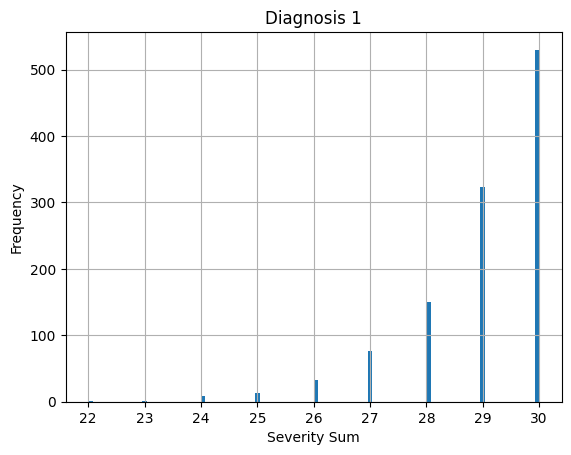

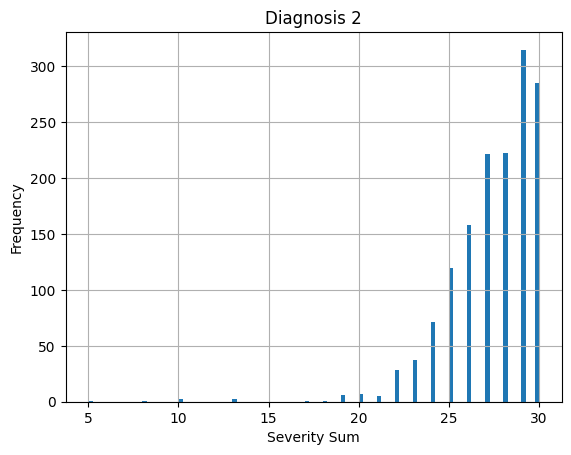

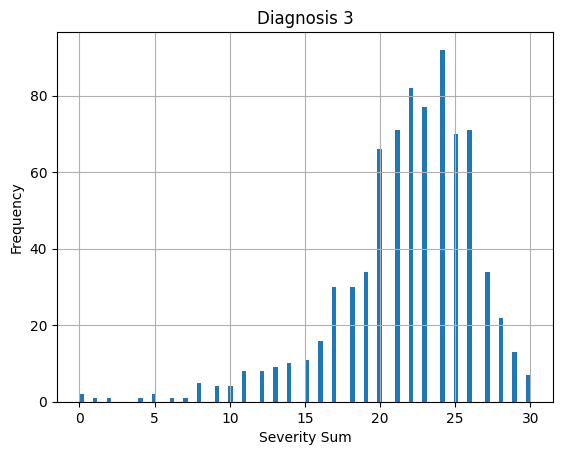

In [7]:
import matplotlib.pyplot as plt
# sevsum distribution for each diagnosis
for i in range(3):
    #distribution graph
    merged_df[merged_df['DIAGNOSIS']==i]['MMSCORE'].hist(bins=100)
    plt.xlabel('Severity Sum')
    plt.ylabel('Frequency')
    plt.title('Diagnosis '+str(i+1))
    plt.show()


In [22]:
#drop rows with DIAGNOSIS non-zero and MMSCORE 30
merged_df = merged_df[~((merged_df['DIAGNOSIS'] > 0) & (merged_df['MMSCORE'] == 30))]

In [27]:
# remove outliers from each diagnosis
for i in range(3):
    q1 = merged_df[merged_df['DIAGNOSIS']==i]['MMSCORE'].quantile(0.25)
    q3 = merged_df[merged_df['DIAGNOSIS']==i]['MMSCORE'].quantile(0.75)
    iqr = q3 - q1
    merged_df = merged_df[~((merged_df['DIAGNOSIS']==i) & ((merged_df['MMSCORE'] < (q1 - 1.5 * iqr))) | (merged_df['MMSCORE'] > (q3 + 1.5 * iqr)))]


In [28]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from scipy.optimize import minimize

# Assuming merged_df and severities are already defined
X = merged_df[tasks].values
#find column that is string type
y = merged_df['DIAGNOSIS'].values

#check if there is any missing value   
print(np.isnan(X).any())
print(np.isnan(y).any())


False
False


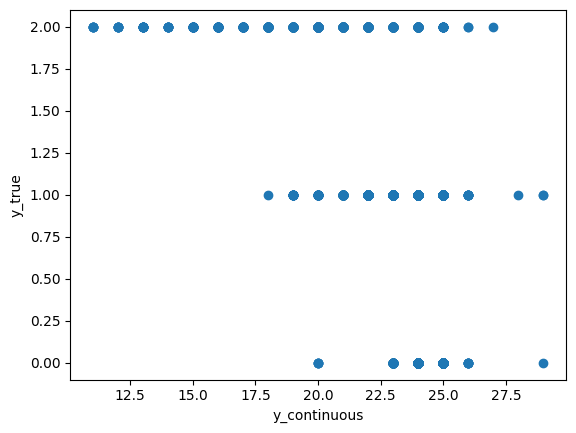

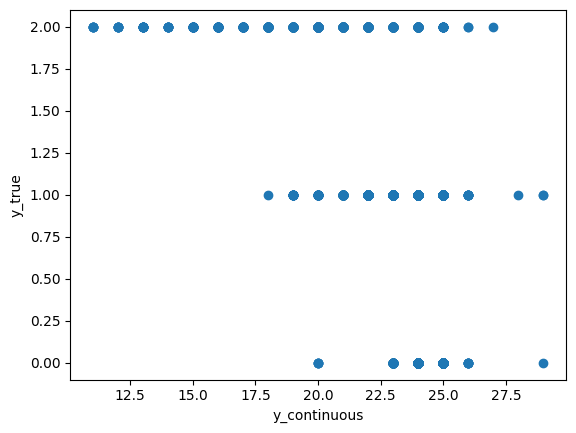

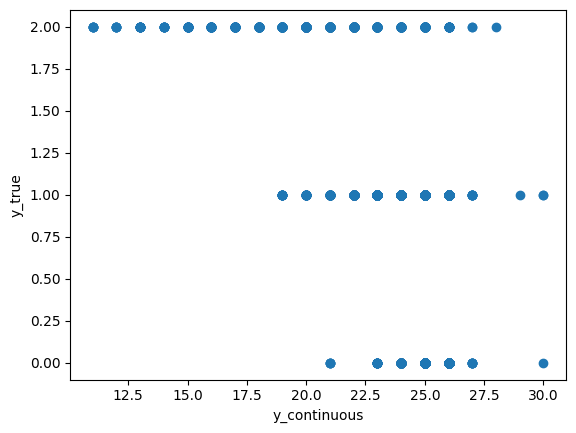

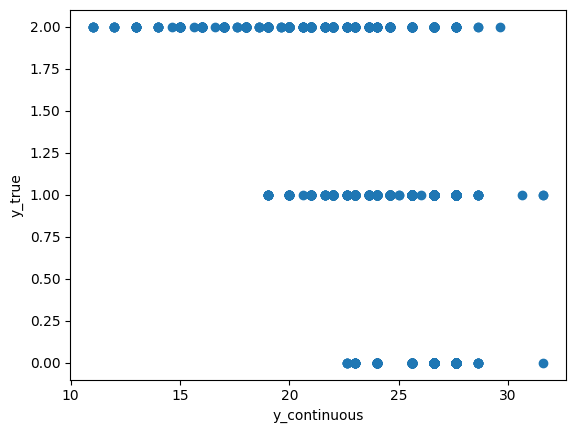

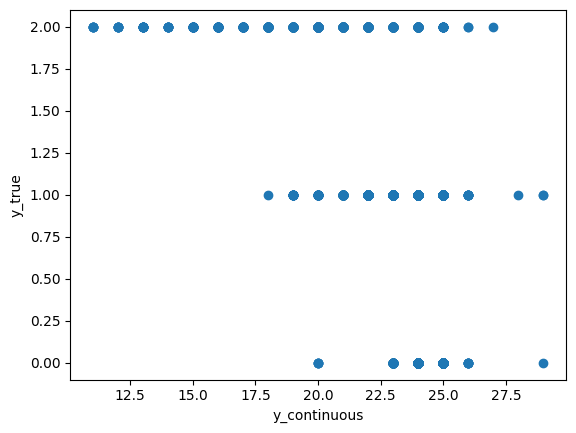

...

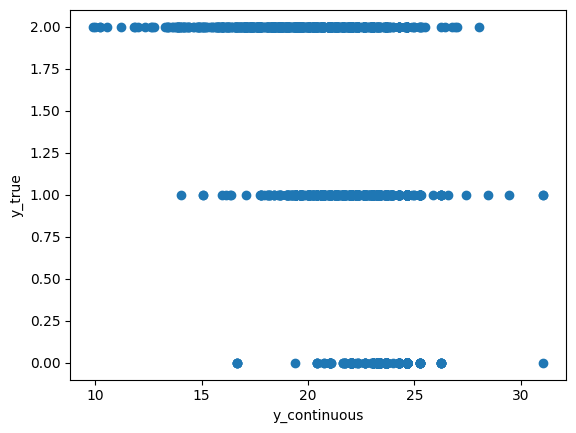

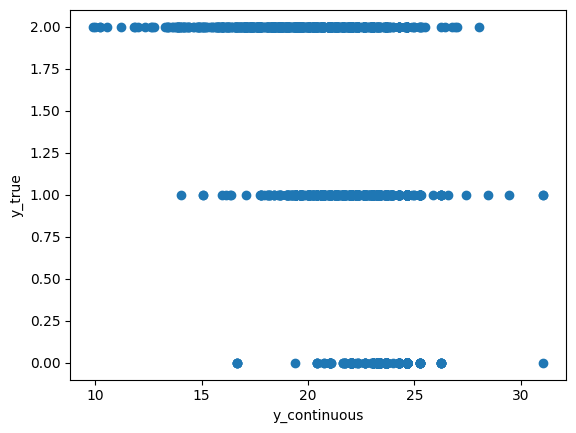

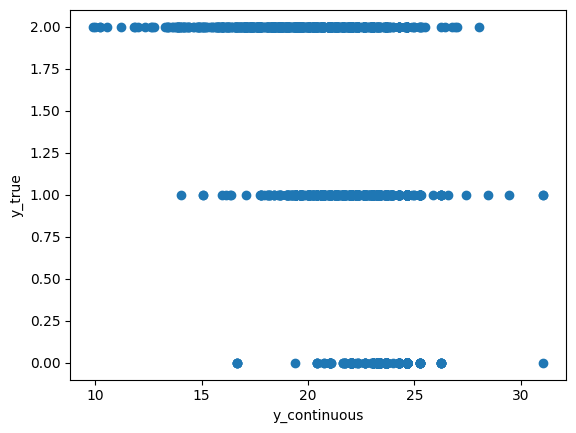

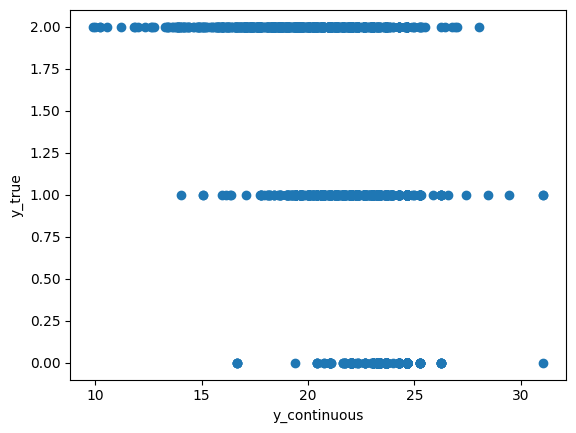

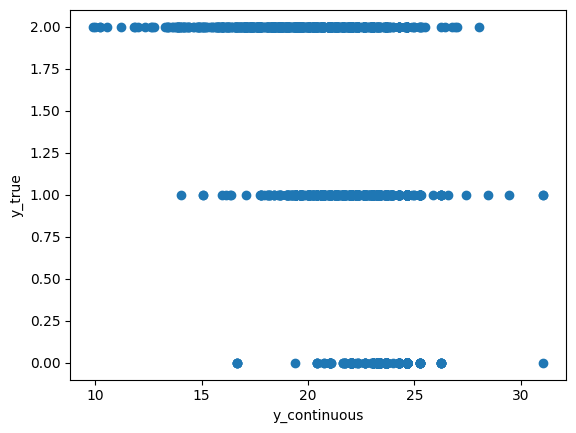

KeyboardInterrupt: 

In [29]:

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Define a function to classify based on thresholds
def classify(y_continuous, thresholds):
    if y_continuous > thresholds[0]:
        return 0
    elif y_continuous > thresholds[1]:
        return 1
    else:
        return 2

# Define a function to optimize weights
def optimize_weights(weights, X, y_true):
    y_continuous = np.dot(X, weights)
    
    
    # Determine optimal thresholds based on the training data
    data=np.concatenate((y_continuous.reshape(-1,1), y_true.reshape(-1,1)), axis=1)
    #scatter plot
    import matplotlib.pyplot as plt
    plt.scatter(data[:,0], data[:,1])
    plt.xlabel('y_continuous')
    plt.ylabel('y_true')
    plt.show()
    
    threshold_0 = np.min(y_continuous[y_true == 0]) + np.max(y_continuous[y_true == 1]) / 2
    threshold_1 = np.min(y_continuous[y_true == 1]) + np.max(y_continuous[y_true == 2]) / 2
    thresholds = [threshold_0, threshold_1]
    
    y_pred_class = [classify(y, thresholds) for y in y_continuous]
    return -accuracy_score(y_true, y_pred_class)  # Negative accuracy for minimization

# Initial guess for weights
initial_weights = np.ones(X_train.shape[1])

# Optimize weights using the training data
result = minimize(optimize_weights, initial_weights, args=(X_train, y_train), method='Powell')
optimal_weights = result.x

# Predict continuous output using optimized weights
y_pred_continuous_train = np.dot(X_train, optimal_weights)
y_pred_continuous_test = np.dot(X_test, optimal_weights)

# Determine optimal thresholds based on the training data
optimal_thresholds = [np.max(y_pred_continuous_train[y_train == 0]) + np.min(y_pred_continuous_train[y_train == 1]) / 2,
                      np.max(y_pred_continuous_train[y_train == 1]) + np.min(y_pred_continuous_train[y_train == 2]) / 2]

# Apply optimal thresholds to classify the test data
y_pred_class = [classify(y, optimal_thresholds) for y in y_pred_continuous_test]

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred_class)
conf_matrix = confusion_matrix(y_test, y_pred_class)

print(f"Optimal Weights: {optimal_weights}")
print(f"Optimal Thresholds: {optimal_thresholds}")
print(f"Accuracy: {accuracy}")
print("Confusion Matrix:")
print(conf_matrix)
print(f"Optimization Success (Weights): {result.success}")
print(f"Optimization Message (Weights): {result.message}")